In [1]:
# Copyright (c) Meta Platforms, Inc. and affiliates.
# Lightly adapted from https://github.com/facebookresearch/segment-anything/blob/main/notebooks/automatic_mask_generator_example.ipynb

# Automatically generating object masks with SAM

Since SAM 2 can efficiently process prompts, masks for the entire image can be generated by sampling a large number of prompts over an image.

The class `SAM2AutomaticMaskGenerator` implements this capability. It works by sampling single-point input prompts in a grid over the image, from each of which SAM can predict multiple masks. Then, masks are filtered for quality and deduplicated using non-maximal suppression. Additional options allow for further improvement of mask quality and quantity, such as running prediction on multiple crops of the image or postprocessing masks to remove small disconnected regions and holes.

<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/sam2/blob/main/notebooks/automatic_mask_generator_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

## Environment Set-up

If running locally using jupyter, first install `SAM 2` in your environment using the installation instructions in the repository.

If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'. Note that it's recommended to use **A100 or L4 GPUs when running in Colab** (T4 GPUs might also work, but could be slow and might run out of memory in some cases).

In [2]:
using_colab = False

In [3]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/sam2.git'

    !mkdir -p images
    !wget -P images https://raw.githubusercontent.com/facebookresearch/sam2/main/notebooks/images/cars.jpg

    !mkdir -p ../checkpoints/
    !wget -P ../checkpoints/ https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_large.pt

## Set-up

In [19]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cpu


In [6]:
np.random.seed(3)

def show_anns(anns, borders=True):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:, :, 3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.5]])
        img[m] = color_mask
        if borders:
            import cv2
            contours, _ = cv2.findContours(m.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
            # Try to smooth contours
            contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
            cv2.drawContours(img, contours, -1, (0, 0, 1, 0.4), thickness=1)

    ax.imshow(img)

## Example image

In [7]:
image = Image.open('images/chickens_frame0.png')
image = np.array(image.convert("RGB"))

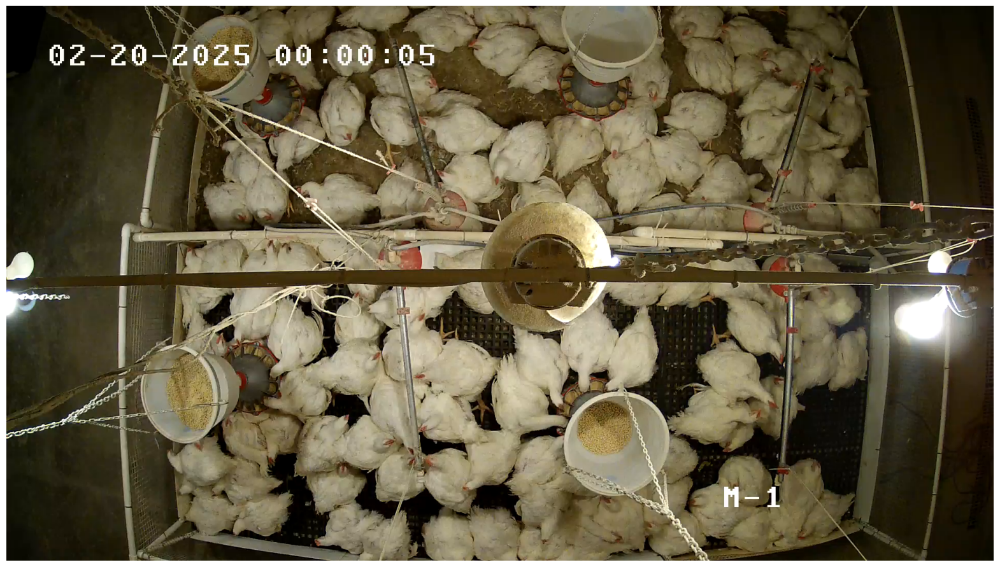

In [8]:
plt.figure(figsize=(20, 20))
plt.imshow(image)
plt.axis('off')
plt.show()

## Automatic mask generation

To run automatic mask generation, provide a version of SAM 2 to the `SAM2AutomaticMaskGenerator` class. Set the path below to the SAM 2 checkpoint.

In [11]:
# import sys
# sys.path.insert(0, os.getcwd())
# print(os.getcwd())
from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

sam2_checkpoint = "../checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

sam2 = build_sam2(model_cfg, sam2_checkpoint, device=device, apply_postprocessing=False)

mask_generator = SAM2AutomaticMaskGenerator(sam2)

To generate masks, just run `generate` on an image.

In [12]:
masks = mask_generator.generate(image)

Mask generation returns a list over masks, where each mask is a dictionary containing various data about the mask. These keys are:
* `segmentation` : the mask
* `area` : the area of the mask in pixels
* `bbox` : the boundary box of the mask in XYWH format
* `predicted_iou` : the model's own prediction for the quality of the mask
* `point_coords` : the sampled input point that generated this mask
* `stability_score` : an additional measure of mask quality
* `crop_box` : the crop of the image used to generate this mask in XYWH format

91
dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])
[621.0, 43.0, 96.0, 94.0]
[0.0, 0.0, 1920.0, 1080.0]
(1080, 1920, 3)
(1080, 1920)


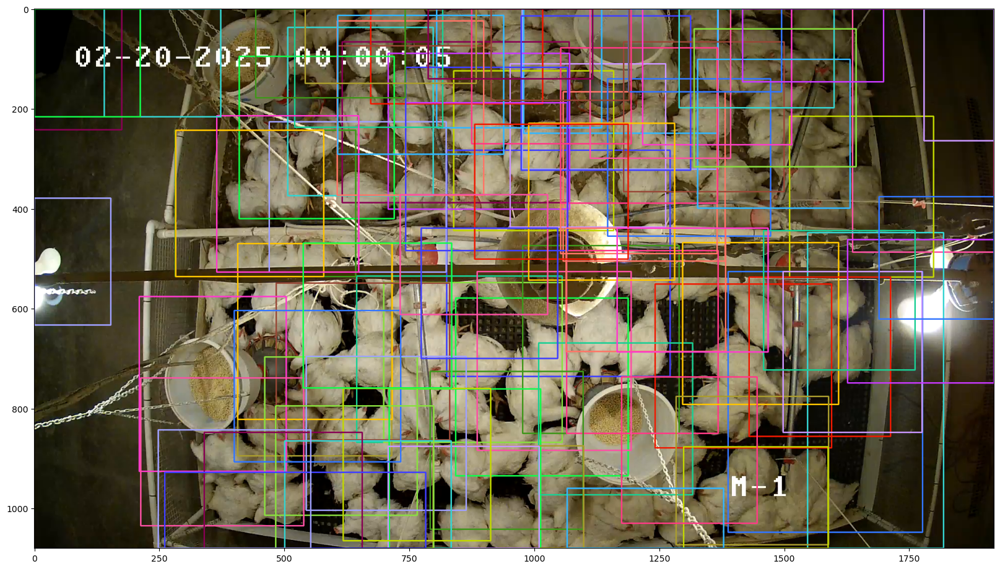

In [23]:
print(len(masks))
masks_idx = 15
print(masks[masks_idx].keys())
print(masks[masks_idx]["bbox"])
print(masks[masks_idx]["crop_box"])
print(image.shape)
print(masks[masks_idx]["segmentation"].shape)

import supervision as sv

detections = sv.Detections.from_sam(sam_result=masks)
bbox_annotator = sv.BoxAnnotator(
    color_lookup=sv.ColorLookup.INDEX
)

# pad bounding boxes
xyxy = sv.pad_boxes(xyxy=detections.xyxy, px=100)

# clips bounding boxes to image bounds
H, W = image.shape[:2]
xyxy = sv.clip_boxes(xyxy=xyxy, resolution_wh=(W, H))

# put the padded and clipped bounding boxes back into the Detections object
detections.xyxy = xyxy

# create a frame that is annotated with the padded and clipped bounding boxes
annotated_frame = bbox_annotator.annotate(
    scene=image.copy(),
    detections=detections
)


# print(annotated_frame)
plt.figure(figsize=(20, 20))
plt.imshow(annotated_frame)
plt.show()

Test out creating a cropped and masked image for each segmentation mask that was found from SAM2 segment everything option.

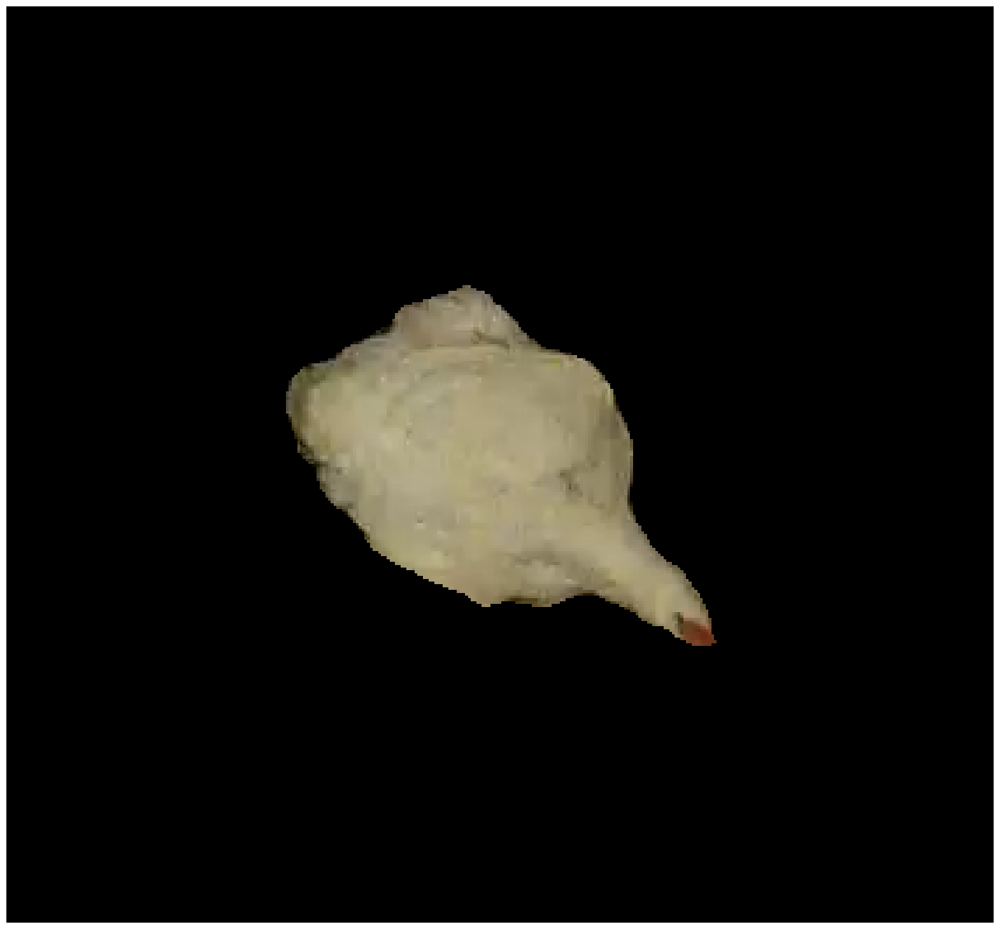

In [24]:
masks_idx = 15

crop_box = detections[masks_idx].xyxy

# image needs to be masked before cropping since the mask has a size array of the original image
masked_image = image.copy()
seg_masks = np.squeeze(detections[masks_idx].mask)
masked_image_index = np.zeros_like(image)
masked_image_index[seg_masks] = masked_image[seg_masks]
masked_cropped_image = sv.crop_image(image=masked_image_index, xyxy=crop_box)

plt.figure(figsize=(20, 20))
plt.imshow(masked_cropped_image)
plt.grid(False)
plt.axis('off')
plt.show()

The section below takes all the segmentation masks, creates cropped and masked images from them, and saves them each as a png file.

In [25]:
import cv2

save_dir = "crops"
os.makedirs(save_dir, exist_ok=True)
for masks_idx in range(len(masks)):
    # get box to crop down to
    crop_box = detections[masks_idx].xyxy
    # image needs to be masked before cropping since the mask has a size array of the original image
    masked_image = image.copy()
    seg_masks = np.squeeze(detections[masks_idx].mask)
    masked_image_index = np.zeros_like(image)
    masked_image_index[seg_masks] = masked_image[seg_masks]
    masked_cropped_image = sv.crop_image(image=masked_image_index, xyxy=crop_box)
    # save the cropped image
    filename = f"crop_{masks_idx:05d}.png"
    img_bgr = cv2.cvtColor(masked_cropped_image, cv2.COLOR_RGB2BGR)
    cv2.imwrite(os.path.join(save_dir, filename), img_bgr, [cv2.IMWRITE_PNG_COMPRESSION, 0])

print(f"Done saving all {len(masks)} crops!")

Done saving all 91 crops!


## Multiple frames from video

Extract n frames from a specified video in a uniform manner. These frames will be used to create training data for the binary classifier that will classify whether an image is a "chicken" or "not chicken".

In [ ]:
import cv2
import os
import numpy as np

def extract_n_uniform_frames(video_path, frame_output_dir, all_frames=False, num_frames=3, resize=None):
    os.makedirs(frame_output_dir, exist_ok=True)
    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    if total_frames == 0:
        raise ValueError("Video contains no frames.")
    
    frame_indices = np.linspace(0, total_frames - 1, num=num_frames, dtype=int)
    
    saved_count = 0
    for i in range(total_frames):
        success, frame = cap.read()
        if not success:
            break
        if i in frame_indices or all_frames:    # if all_frames is True, save all frames. if not true, save only specific ones
            if resize:
                frame = cv2.resize(frame, resize)
            basename = os.path.splitext(os.path.basename(video_path))[0]
            idx = 0
            while True:
                out_path = os.path.join(frame_output_dir, f"{basename}_frame{idx:05d}.jpg")
                if not os.path.exists(out_path):
                    break
                idx += 1
            cv2.imwrite(out_path, frame)
            saved_count += 1
    cap.release()
    print(f"Saved {saved_count} frames from {video_path}")

Create a small amount of frames to use to create training dataset

In [ ]:
video_name = "chickens3.mp4"
video_path = f"./videos/{video_name}"
frame_output_dir = f"./videos/{os.path.splitext(video_name)[0]}/training"
num_frames = 8
extract_n_uniform_frames(video_path, frame_output_dir, all_frames=False, num_frames=num_frames)

Iterating through the frames that were saved above, perform "segment everything" on the current frame in order to get a set of segmentation masks. After cleaning up the bounding boxes for saving the images by padding and cropping, go through each segmentation mask in the current frame, black out everything except the current segmentation mask object, crop the image down to the padded bounding box frame, and save the image into a directory. These images will be used for training the binary classifier whether an image is a "chicken" or "not chicken".

In [ ]:
total_count = 0

for frame_idx, fname in enumerate(os.listdir(frame_output_dir)):
    fpath = os.path.join(frame_output_dir, fname)
    print(fpath)
    frame = Image.open(fpath)
    frame = np.array(frame.convert("RGB"))
    new_mask = mask_generator.generate(frame)
    print("Another frame mask down...")

    detections = sv.Detections.from_sam(sam_result=new_mask)

    # pad bounding boxes
    xyxy = sv.pad_boxes(xyxy=detections.xyxy, px=100)

    # clips bounding boxes to image bounds
    H, W = frame.shape[:2]
    xyxy = sv.clip_boxes(xyxy=xyxy, resolution_wh=(W, H))

    # put the padded and clipped bounding boxes back into the Detections object
    detections.xyxy = xyxy

    save_dir = f"./data/{os.path.splitext(video_name)[0]}"
    os.makedirs(save_dir, exist_ok=True)
    for masks_idx in range(len(new_mask)):
        # get box to crop down to
        crop_box = detections[masks_idx].xyxy
        # image needs to be masked before cropping since the mask has a size array of the original image
        masked_image = frame.copy()
        seg_masks = np.squeeze(detections[masks_idx].mask)
        masked_image_index = np.zeros_like(image)
        masked_image_index[seg_masks] = masked_image[seg_masks]
        masked_cropped_image = sv.crop_image(image=masked_image_index, xyxy=crop_box)
        # save the cropped image
        idx = 0
        while True:
            filename = f"crop_{idx:05d}.png"
            crop_path = os.path.join(save_dir, filename)
            if not os.path.exists(crop_path):
                break
            idx += 1
        img_bgr = cv2.cvtColor(masked_cropped_image, cv2.COLOR_RGB2BGR)
        cv2.imwrite(crop_path, img_bgr, [cv2.IMWRITE_PNG_COMPRESSION, 0])

    total_count += len(new_mask)
    print(f"Done saving all {len(new_mask)} crops!")
print(f"Done saving all {total_count} crops from all masks!")

./videos/chickens3/chickens3.mp4_frame06.jpg
Another frame mask down...
Done saving all 116 crops!
./videos/chickens3/chickens3.mp4_frame04.jpg
Another frame mask down...
Done saving all 129 crops!
./videos/chickens3/chickens3.mp4_frame01.jpg
Another frame mask down...
Done saving all 122 crops!
./videos/chickens3/chickens3.mp4_frame07.jpg
Another frame mask down...
Done saving all 112 crops!
./videos/chickens3/chickens3.mp4_frame05.jpg
Another frame mask down...
Done saving all 116 crops!
./videos/chickens3/chickens3.mp4_frame02.jpg
Another frame mask down...
Done saving all 118 crops!
./videos/chickens3/chickens3.mp4_frame03.jpg
Another frame mask down...
Done saving all 117 crops!
./videos/chickens3/chickens3.mp4_frame00.jpg
Another frame mask down...
Done saving all 122 crops!
Done saving all 952 crops from all masks!


Show all the masks overlayed on the most recently pulled image.

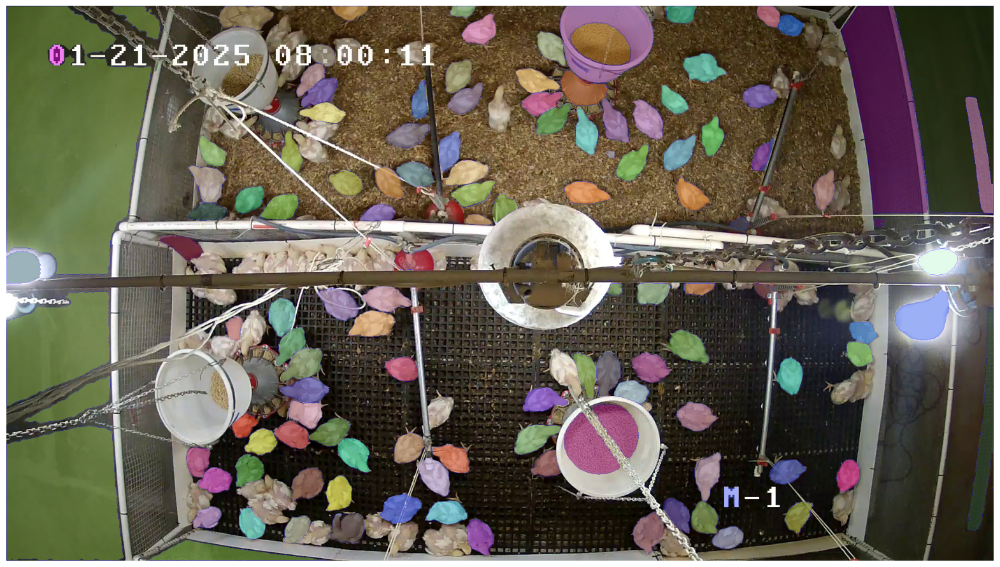

In [29]:
plt.figure(figsize=(20, 20))
# plt.imshow(image)
# show_anns(masks)
plt.imshow(frame)
show_anns(new_mask)
plt.axis('off')
plt.show()

Tried to use OpenCLIP for pre-labeling data, but it did a very poor job, so just did manual annotation. Had to just put all the training images gathered above to a zip file, export it to my personal computer (exporting from the PACE ICE Cluster that I've been running this notebook on), use a custom script titled `label_images.py` to label the images, and use a custom script titled `combine_datasets.py` to combine separate datasets of images gathered from separate videos and labeled separately into a single dataset. This section below makes the custom chicken dataset capatible with pytorch.

In [ ]:
import pandas as pd
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
from torchvision.io import decode_image
from sklearn.model_selection import train_test_split

class ChickenImageDataset(Dataset):
    def __init__(self, annotations_file, img_dir, transform=None, target_transform=None):
        df = pd.read_csv(annotations_file)
        self.img_labels = df.copy()
        self.img_labels["filename"] = self.img_labels["filename"].str.extract(r'(crop.*)')
        self.img_labels = self.img_labels.dropna(subset=["filename", "label", "label_id"]).reset_index(drop=True)
        self.img_dir = img_dir
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.img_labels)
    
    def __getitem__(self, idx):

        row = self.img_labels.iloc[idx]
        img_path = os.path.join(self.img_dir, row["filename"])

        image = Image.open(img_path).convert("RGB")
 
        label = row["label_id"]
        if self.transform:
            image = self.transform(image)
        if self.target_transform:
            label = self.target_transform(label)
        return image, torch.tensor(label, dtype=torch.float32)

train_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

test_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

Create an instance of the custom chicken dataset and load it up for pytorch to use in following cells.

In [ ]:
img_dir = "data/combined_chickens"
label_file = os.path.join(img_dir, "0_combined_labels.csv")
full_ds = ChickenImageDataset(label_file, img_dir, transform=None)
batch_size = 16

all_indices = list(range(len(full_ds)))

train_idx, test_idx = train_test_split(
    all_indices,
    test_size=0.2,
    shuffle=True,
    stratify=full_ds.img_labels["choice"],
    random_state=42
)

train_ds = torch.utils.data.Subset(
    ChickenImageDataset("data/labels.csv", "crops", transform=train_transforms),
    train_idx
)
test_ds = torch.utils.data.Subset(
    ChickenImageDataset("data/labels.csv", "crops", transform=test_transforms),
    test_idx
)

train_dataloader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, drop_last=True)
test_dataloader = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

Import the CIFAR10 dataset for testing neural network functionality. Convert the dataset to only classify "bird" or "not bird". Mainly a sanity check.

In [52]:
from torchvision.datasets import CIFAR10

train_data = CIFAR10(root='./data', train=True, download=True, transform=train_transforms)
test_data = CIFAR10(root='./data', train=False, download=True, transform=test_transforms)

# convert to binary: bird = 2
train_data = [(img, 1 if label == 2 else 0) for img, label in train_data]
test_data = [(img, 1 if label == 2 else 0) for img, label in test_data]

batch_size = 16

train_dataloader = DataLoader(train_data, batch_size=batch_size, shuffle=True, drop_last=True)
test_dataloader = DataLoader(test_data, batch_size=batch_size, shuffle=False)

100%|██████████| 170M/170M [00:03<00:00, 53.7MB/s] 


Create the neural network that is used for the binary classifier.

In [53]:
from torch import nn
from torchvision import models

# model2 = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
# print(model2)

weights = models.ResNet18_Weights.IMAGENET1K_V1
model = models.resnet18(weights=weights)

# freeze all the parameters in the feature extractor
for param in model.parameters():
    param.requires_grad = False

# unfreeze the final convolutional block (layer4)
for param in model.layer4.parameters():
    param.requires_grad = True

# get number of features for final classification layer, then replace that layer with number of output features (1 for binary)
num_features = model.fc.in_features
model.fc = nn.Sequential(
    nn.Dropout(p=0.5, inplace=True),
    nn.Linear(num_features, 1),
)

model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

Train neural network classifier

In [ ]:
import torch.optim

def train_loop(dataloader, model, loss_fn, optimizer):
    size = len(dataloader.dataset)
    # set the model to training mode
    model.train()
    for batch, (X, y) in enumerate(dataloader):
        optimizer.zero_grad()

        X = X.to(device)
        y = y.to(device)
        y = y.unsqueeze(1).float()
        # compute predicition and loss
        pred = model(X)
        loss = loss_fn(pred, y)

        # backprop
        loss.backward()
        optimizer.step()

        if batch % 100 == 0:
            loss, current = loss.item(), batch * batch_size + len(X)
            print(f"loss: {loss:>7f} [{current:>5d}/{size:>5d}]")


def test_loop(dataloader, model, loss_fn):
    # set the model to eval mode
    model.eval()
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    test_loss, correct = 0, 0

    with torch.no_grad():
        for X, y in dataloader:
            X = X.to(device)
            y = y.to(device)
            y = y.unsqueeze(1).float()
            pred = model(X)
            test_loss += loss_fn(pred, y).item()
            predicted_labels = (torch.sigmoid(pred) > 0.5).float()
            correct += (predicted_labels == y).sum().item()

    test_loss /= num_batches
    correct /= size
    print(f"Test Error: /n Accuracy: {(100*correct):>0.1f}%, Avg loss: {test_loss:>8f} \n")


learning_rate_head = 1e-4
learning_rate_body = 1e-5
epochs = 50
optimizer = torch.optim.Adam([
    {'params': model.fc.parameters(), 'lr': learning_rate_head},
    {'params': model.layer4.parameters(), 'lr': learning_rate_body},
], weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)
pos_weight_value = 21 / 70
pos_weight_tensor = torch.tensor([pos_weight_value], device=device)
loss_fn = nn.BCEWithLogitsLoss(pos_weight=pos_weight_tensor)

for t in range(epochs):
    print(f"Epoch {t+1}\n-----------------------------")
    train_loop(train_dataloader, model, loss_fn, optimizer)
    test_loop(test_dataloader, model, loss_fn)
    scheduler.step()
print("Done!")

Epoch 1
-----------------------------
loss: 0.998312 [   16/50000]
loss: 0.723758 [ 1616/50000]
loss: 0.887345 [ 3216/50000]
loss: 0.714580 [ 4816/50000]
loss: 0.945950 [ 6416/50000]
loss: 0.876700 [ 8016/50000]
loss: 0.902444 [ 9616/50000]
loss: 0.990411 [11216/50000]
loss: 0.864297 [12816/50000]
loss: 0.775716 [14416/50000]
loss: 0.944450 [16016/50000]
loss: 0.932386 [17616/50000]
loss: 0.769393 [19216/50000]
loss: 1.000669 [20816/50000]
loss: 0.603079 [22416/50000]
loss: 0.907994 [24016/50000]
loss: 0.767579 [25616/50000]
loss: 0.964633 [27216/50000]
loss: 0.809698 [28816/50000]
loss: 0.631376 [30416/50000]
loss: 0.833312 [32016/50000]
loss: 0.817434 [33616/50000]
loss: 0.743010 [35216/50000]
loss: 0.717626 [36816/50000]
loss: 0.913697 [38416/50000]
loss: 0.649188 [40016/50000]
loss: 0.739617 [41616/50000]
loss: 0.811784 [43216/50000]
loss: 0.678498 [44816/50000]
loss: 0.726285 [46416/50000]
loss: 0.665734 [48016/50000]
loss: 0.663143 [49616/50000]
Test Error: /n Accuracy: 43.8%, Av

KeyboardInterrupt: 

Now that the neural network has been trained on our custom dataset, we can perform inference on images from a video of chickens to classify the different segmentation masks as "chicken" or "not chicken". These classifications will later be used to create single videos for each chicken. First, let's create all the frames from the video and store them.

In [ ]:
# `video_dir` a directory of JPEG frames with filenames like `<frame_index>.jpg`
video_name = "chickens3.mp4"
video_path = f"./videos/{video_name}"
frame_output_dir = f"./videos/{os.path.splitext(video_name)[0]}/all_frames"

print(os.path.splitext(video_name)[0])
print(frame_output_dir)

# create all frames from video
extract_n_uniform_frames(video_path, frame_output_dir, all_frames=True)

chickens3
./videos/chickens3/all_frames
Saved 451 frames from ./videos/chickens3.mp4


chickens3_frame00089.jpg


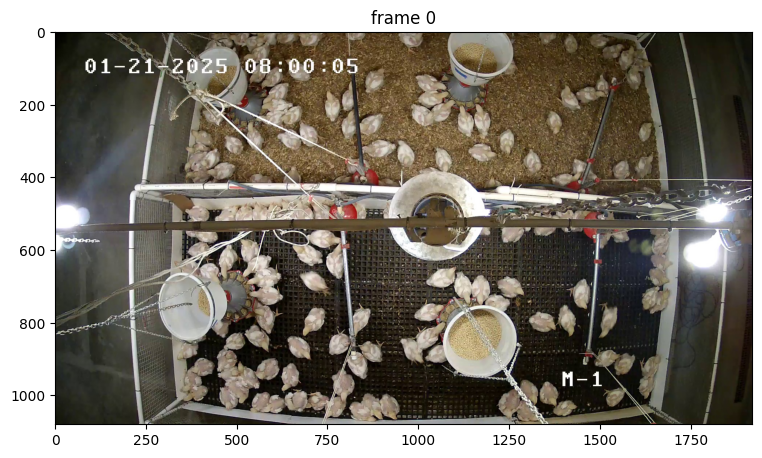

In [ ]:
# scan all the JPEG frame names in this directory
frame_names = [
    p for p in os.listdir(frame_output_dir)
    if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG"]
]
print(os.listdir(frame_output_dir)[0])
frame_names.sort(key=lambda p: int(os.path.splitext(p.split("_")[1])[0].removeprefix("frame")))

# take a look the first video frame
frame_idx = 0
plt.figure(figsize=(9, 6))
plt.title(f"frame {frame_idx}")
plt.imshow(Image.open(os.path.join(frame_output_dir, frame_names[frame_idx])))

In [ ]:
fname = frame_names[0]

fpath = os.path.join(frame_output_dir, fname)
print(fpath)
frame = Image.open(fpath)
frame = np.array(frame.convert("RGB"))
new_mask = mask_generator.generate(frame)

detections = sv.Detections.from_sam(sam_result=new_mask)

# pad bounding boxes
xyxy = sv.pad_boxes(xyxy=detections.xyxy, px=100)

# clips bounding boxes to image bounds
H, W = frame.shape[:2]
xyxy = sv.clip_boxes(xyxy=xyxy, resolution_wh=(W, H))

# put the padded and clipped bounding boxes back into the Detections object
detections.xyxy = xyxy

save_dir = f"./data/{os.path.splitext(video_name)[0]}"
os.makedirs(save_dir, exist_ok=True)
for detection in detections:
    # get box to crop down to
    crop_box = detection.xyxy
    # image needs to be masked before cropping since the mask has a size array of the original image
    masked_image = frame.copy()
    seg_masks = np.squeeze(detection.mask)
    masked_image_index = np.zeros_like(image)
    masked_image_index[seg_masks] = masked_image[seg_masks]
    masked_cropped_image = sv.crop_image(image=masked_image_index, xyxy=crop_box)
    # save the cropped image
    idx = 0
    while True:
        filename = f"crop_{idx:05d}.png"
        crop_path = os.path.join(save_dir, filename)
        if not os.path.exists(crop_path):
            break
        idx += 1
    img_bgr = cv2.cvtColor(masked_cropped_image, cv2.COLOR_RGB2BGR)
    cv2.imwrite(crop_path, img_bgr, [cv2.IMWRITE_PNG_COMPRESSION, 0])
    out = model(masked_cropped_image)
    class_pred = torch.argmax(out, dim=1)
    detection.class_id = class_pred

print(f"Done predicting classes for all {len(new_mask)} segmentations!")

chickens3_frame00000.jpg


Function to show mask on image for SAM2 video predictor testing.

In [ ]:
def show_mask(mask, ax, obj_id=None, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        cmap = plt.get_cmap("tab10")
        cmap_idx = 0 if obj_id is None else obj_id
        color = np.array([*cmap(cmap_idx)[:3], 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

Create the SAM2 predictor object.

In [ ]:
from sam2.build_sam import build_sam2_video_predictor

predictor = build_sam2_video_predictor(model_cfg, sam2_checkpoint, device=device)

Initialize the SAM2 inference state.

In [ ]:
inference_state = predictor.init_state(video_path=frame_output_dir)

predictor.reset_state(inference_state)

Add a single mask object to frame 0 and visualize it

In [ ]:
import random

ann_frame_idx = 0
ann_obj_id = 1

mask_sample = random.choice(detections).mask

_, out_obj_ids, out_mask_logits = predictor.add_new_mask(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    mask=mask_sample,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(frame_output_dir, frame_names[ann_frame_idx])))
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

Propagate the single mask through the video

In [ ]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# render the segmentation results every few frames
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(frame_output_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

Create a single test "tracklet" with one chicken as the focus and the rest of the chickens blacked out

In [ ]:
cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
cap.release()
print(f"Original fps: {fps}")

tracklet_output_dir = f"./videos/{os.path.splitext(video_name)[0]}/tracklets"
frame_selection = 0
object_selection = random.choice(video_segments[frame_selection])   # randomly selecting a mask object from the selected frame
tracklet_name = f"chicken_{object_selection.key()}"   # naming the tracklet output video file using the randomly selected segmentation object's id
out = cv2.VideoWriter(tracklet_name, cv2.VideoWriter_fourcc(*"mp4v"), fps, (width, height))

# use the previously selected random mask object from the video_segments dict
# loop through each frame, annotating it, and writing to video output file
#TODO: need to print out frame from video_segments so I can see what the dict looks like
for frame in video_segments:
    # put the annotations on the frame here
    # pull in blank frame for black mask overlay
    clean_frame = np.array(Image.open(os.path.join(frame_output_dir, frame_names[int(frame.key())])))

    # create blackout mask
    blackout_mask = np.zeros_like(frame[:, :, 0], dtype=bool)
    for out_obj_id, out_mask in video_segments[frame_selection].items():
        if out_obj_id != object_selection.key():
            blackout_mask |= out_mask

    # apply blackout
    clean_frame[blackout_mask] = 0
    
    # write annotated frame to video
    out.write(clean_frame)
out.release()

Add all masks in a loop after resetting the inference state

In [ ]:
predictor.reset_state(inference_state)

ann_frame_idx = 0
ann_obj_id = 1

for ann_obj_id, detection in enumerate(detections):
    if detection.class_id == "not chicken":     # skip the non-chicken objects
        continue
    mask_sample = detection.mask

    _, out_obj_ids, out_mask_logits = predictor.add_new_mask(
        inference_state=inference_state,
        frame_idx=ann_frame_idx,
        obj_id=ann_obj_id,
        mask=mask_sample,
    )

Propagate the masks throughout the entire video

In [ ]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# render the segmentation results every few frames
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(frame_output_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

Create a "tracklet" video clip for each chicken mask instance where all other chickens are blacked out throughout the entire video. Background objects will be left in.

In [ ]:
# insert other logic above
# loop through each mask object within the video_segments dict
for mask_obj_idx in range(len(video_segments[frame_selection])):
    # nested loop through each frame, annotating it, and writing to video output file
    for frame in video_segments:
        # put the annotations on the frame here
        
        # write frame to video
        out.write(frame)
    out.release()

## Automatic mask generation options

There are several tunable parameters in automatic mask generation that control how densely points are sampled and what the thresholds are for removing low quality or duplicate masks. Additionally, generation can be automatically run on crops of the image to get improved performance on smaller objects, and post-processing can remove stray pixels and holes. Here is an example configuration that samples more masks:

In [ ]:
mask_generator_2 = SAM2AutomaticMaskGenerator(
    model=sam2,
    points_per_side=64,
    points_per_batch=128,
    pred_iou_thresh=0.7,
    stability_score_thresh=0.92,
    stability_score_offset=0.7,
    crop_n_layers=1,
    box_nms_thresh=0.7,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=25.0,
    use_m2m=True,
)

In [ ]:
masks2 = mask_generator_2.generate(image)

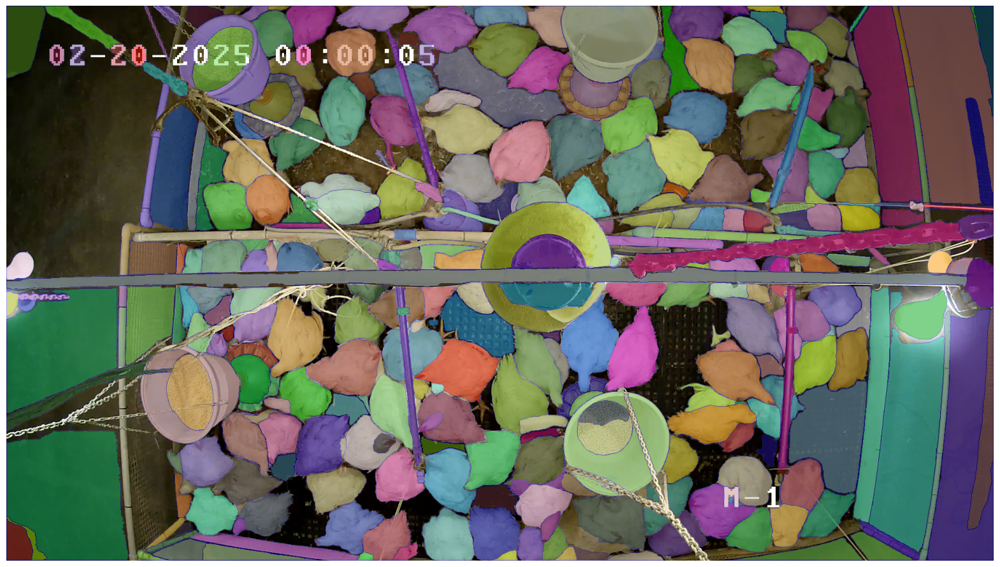

In [ ]:
plt.figure(figsize=(20, 20))
plt.imshow(image)
show_anns(masks2)
plt.axis('off')
plt.show()

341
975 1097 79 170


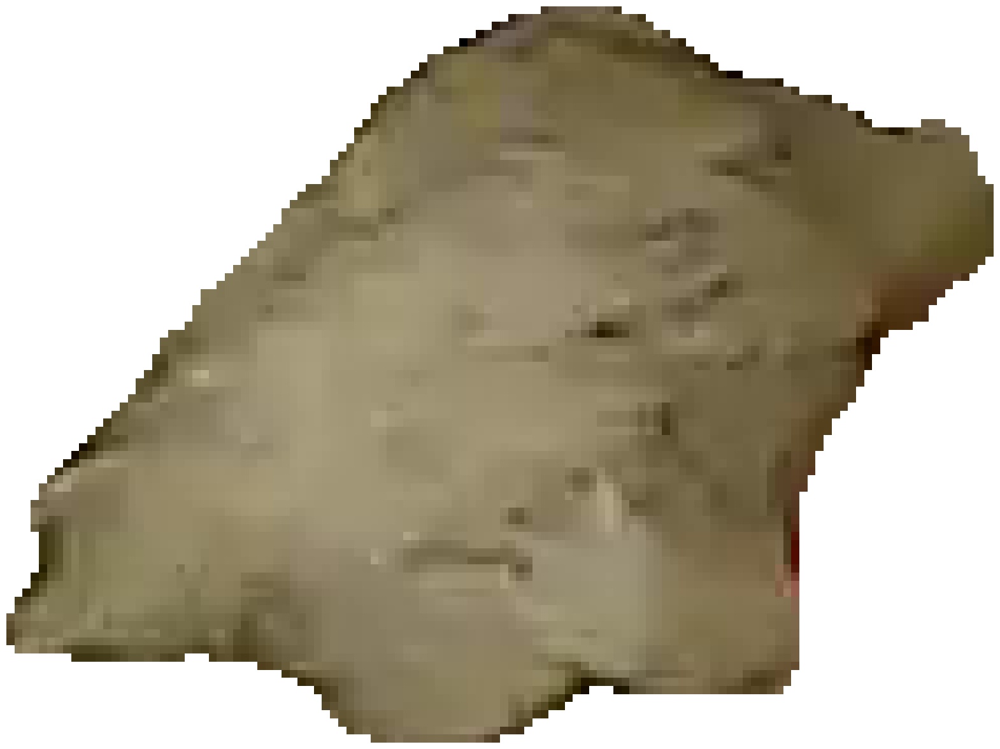

In [ ]:
masks_idx = 3
print(len(masks2))
crop_left_side = int(masks2[masks_idx]["bbox"][0])
crop_right_side = int(masks2[masks_idx]["bbox"][0] + masks2[masks_idx]["bbox"][2])
crop_top_side = int(masks2[masks_idx]["bbox"][1])
crop_bottom_side = int(masks2[masks_idx]["bbox"][1] + masks2[masks_idx]["bbox"][3])
print(crop_left_side, crop_right_side, crop_top_side, crop_bottom_side)
masked = image.copy()
masked[~masks2[masks_idx]["segmentation"]] = 255
masked_cropped = masked[crop_top_side:crop_bottom_side, crop_left_side:crop_right_side]
plt.figure(figsize=(20, 20))
plt.imshow(masked_cropped)
plt.grid(False)
plt.axis('off')
plt.show()

In [ ]:
from transformers import ViTImageProcessor, ViTForImageClassification
import torch

processor = ViTImageProcessor.from_pretrained('google/vit-base-patch16-224')
model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224')

input_image = masked_cropped

inputs = processor(images=input_image, return_tensors="pt")
outputs = model(**inputs)
logits = outputs.logits

predicted_class_idx = logits.argmax(-1).item()
print(f"Predicted class: {model.config.id2label[predicted_class_idx]}")

Predicted class: ocarina, sweet potato
